<a href="https://colab.research.google.com/github/cchang-vassar/Semantic-Relations-in-Vector-Embeddings/blob/main/study1_1_%5Bada002%5Dpca.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [ada-002] Current Embeddings of Arguments and Counterarguments

## Set Up

### Imports

In [ ]:
# General imports
import os
import zipfile
import shutil
import subprocess
import re
import pickle
import numpy as np
import pandas as pd
from enum import Enum
from typing import Optional
from ctypes import Union
from google.colab import userdata

### OSF Setup

In [ ]:
!pip install osfclient

In [ ]:
os.environ["OSF_USERNAME"] = userdata.get("OSF_USERNAME")
OSF_USERNAME = os.environ["OSF_USERNAME"]

In [ ]:
os.environ["OSF_PASSWORD"] = userdata.get("OSF_PASSWORD")
OSF_PASSWORD = os.environ["OSF_PASSWORD"]

In [ ]:
os.environ["OSF_TOKEN"] = userdata.get("OSF_TOKEN")
OSF_TOKEN = os.environ["OSF_TOKEN"]

In [ ]:
os.environ["OSF_PROJECT_ID"] = userdata.get("OSF_PROJECT_ID")
OSF_PROJECT_ID = os.environ["OSF_PROJECT_ID"]

### OpenAI Setup

In [ ]:
!pip install openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.6/311.6 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.3 MB/s eta 0:00:00


In [ ]:
import openai
from openai import OpenAI
os.environ["OPENAI_API_KEY"] = userdata.get('OPENAI_API_KEY')

In [ ]:
client = OpenAI()

### Class Declarations

In [ ]:
# Enum for categories
class Category(Enum):
  CULTURE = "culture"
  DIGITAL_FREEDOMS = "digital-freedoms"
  ECONOMY = "economy"
  EDUCATION = "education"
  ENVIRONMENT = "environment"
  FREE_SPEECH_DEBATE = "free-speech-debate"
  HEALTH = "health"
  INTERNATIONAL = "international"
  LAW = "law"
  PHILOSOPHY = "philosophy"
  POLITICS = "politics"
  RELIGION = "religion"
  SCIENCE = "science"
  SOCIETY = "society"
  SPORT = "sport"

In [ ]:
# Enum for processing unit
class ProcessingUnit(Enum):
  GLOBAL = "global"
  CATEGORY = "category"
  DEBATE = "debate"

In [ ]:
class Dataset(Enum):
  TRAINING = "training"
  TEST = "test"

## Get Embeddings

### [Imports] Get Embeddings

In [ ]:
!pip install tenacity

In [ ]:
import time
from tenacity import (
  retry,
  stop_after_attempt,
  wait_random_exponential
)

### [OSF-Import] Import embeddings dump from OSF

In [ ]:
def import_embeddings_dump():
  """Import embeddings_dump from OSF"""
  subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/ada002-autoencoder/ada_embeddings_dump.zip", shell=True)
  print("ada_embeddings_dump.zip successfully imported")

  embeddings_dump_file_path_zip = 'ada_embeddings_dump.zip'
  embeddings_dump_file_path = 'current-data-dump/embeddings-dump'
  os.makedirs(embeddings_dump_file_path, exist_ok=True)
  with zipfile.ZipFile(embeddings_dump_file_path_zip, 'r') as zip_ref:
    zip_ref.extractall(embeddings_dump_file_path)

  extracted_files = os.listdir(embeddings_dump_file_path)
  print("Files extracted:", extracted_files)

### [Write] Embeddings df

In [ ]:
def _embeddings_write_to_file(
  embeddings_df: pd.DataFrame,
  category: Optional[str] = None,
  topic: Optional[str] = None,
  dataset: Dataset = Dataset.TRAINING
  ):
  """Write extracted embeddings to pickle file"""

  # Debate case
  if topic and category:
    topic_path = topic.replace('-', '_')
    folder_path = f'current-data-dump/embeddings-dump/{"training" if dataset == Dataset.TRAINING else "test"}/{category}/'
    file_path = f'{folder_path}{topic_path}_embeddings.pkl'

  # Category case
  elif category:
    folder_path = f'current-data-dump/embeddings-dump/{"training" if dataset == Dataset.TRAINING else "test"}/{category}/'
    file_path = f'{folder_path}{category}_embeddings.pkl'

  # Global case
  else:
    folder_path = f'current-data-dump/embeddings-dump/{"training" if dataset == Dataset.TRAINING else "test"}/'
    file_path = f'{folder_path}global_embeddings.pkl'

  os.makedirs(folder_path, exist_ok=True)
  with open(file_path, 'wb') as file:
    pickle.dump(embeddings_df, file)
    print(f"File uploaded to {file_path}")

### [All] Embeddings df

In [ ]:
DIM_EMBEDDING = 1536

@retry(wait=wait_random_exponential(min=60, max=500), stop=stop_after_attempt(10))
def _get_embeddings(arguments: list) -> list:
  """Convert an argument into a (1 x 1536) embedding df"""
  embeddings = client.embeddings.create(input=arguments, model="text-embedding-ada-002")
  embeddings_data = [embedding_data.embedding for embedding_data in embeddings.data]
  embeddings_df = pd.DataFrame(embeddings_data, columns=[f"{str(i)}" for i in range(DIM_EMBEDDING)])
  return embeddings_df.reset_index(drop=True)

In [ ]:
API_LIMIT = 1000

def get_embeddings_df(
    arguments_df: pd.DataFrame,
    processing_unit: ProcessingUnit,
    debate_category: Optional[Category] = None,
    dataset: Optional[Dataset] = Dataset.TRAINING
    ) -> pd.DataFrame:
  """Add embeddings column to a df"""
  embeddings_df = pd.DataFrame()
  arguments_list = list(arguments_df['argument'])
  total_len = len(arguments_list)
  i = 0

  # Grab embeddings from arguments column in chunks
  while i < total_len:
    embeddings = _get_embeddings(arguments_list[i:min(total_len, i+API_LIMIT)])
    embeddings_df = pd.concat([embeddings_df, embeddings], axis=0, ignore_index=True)
    i = i + API_LIMIT
  arguments_embeddings_df = pd.concat([arguments_df, embeddings_df], axis=1)

  # Write embeddings df to file
  if processing_unit == ProcessingUnit.GLOBAL:
    _embeddings_write_to_file(arguments_embeddings_df, None, None, dataset=dataset)
  elif processing_unit == ProcessingUnit.CATEGORY:
    _embeddings_write_to_file(arguments_embeddings_df, arguments_embeddings_df['category'].iloc[0], None, dataset=dataset)
  elif processing_unit == ProcessingUnit.DEBATE:
    _embeddings_write_to_file(arguments_embeddings_df, debate_category.value, arguments_embeddings_df['topic'].iloc[0], dataset=dataset)
  return arguments_embeddings_df

### [OSF-Export] Export embeddings dump to OSF

In [ ]:
def export_embeddings_dump():
  """Export embeddings_dump to OSF"""
  embeddings_dump_file_path = 'current-data-dump/embeddings-dump'
  embeddings_dump_file_path_zip = 'current-data-dump/embeddings-dump'
  shutil.make_archive(embeddings_dump_file_path_zip, 'zip', embeddings_dump_file_path)
  print(f"Zip file created at: {embeddings_dump_file_path_zip}")
  result = subprocess.run([f"osf -p sakjg upload --force {embeddings_dump_file_path_zip}.zip data-dump/ada002-autoencoder/ada_embeddings_dump.zip"], shell=True, capture_output=True, text=True)
  print(result.stderr)
  print(f"File: {embeddings_dump_file_path_zip} uploaded at osfstorage")

## Analyze Embeddings

### [Imports] Analysis df

In [ ]:
import joblib
from sklearn.decomposition import PCA

### [OSF-Import] Import pca dump from OSF

In [ ]:
def import_pca_dump():
  """Import pca_dump from OSF"""
  subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/ada002-autoencoder/ada_pca_dump.zip", shell=True)
  print("pca_dump.zip successfully imported")

  pca_dump_file_path_zip = 'ada_pca_dump.zip'
  pca_dump_file_path = 'current-data-dump/pca-dump'
  with zipfile.ZipFile(pca_dump_file_path_zip, 'r') as zip_ref:
    zip_ref.extractall(pca_dump_file_path)

  extracted_files = os.listdir(pca_dump_file_path)
  print("Files extracted:", extracted_files)

### [Write] Analysis df

In [ ]:
def _analysis_write_to_file(
  processing_unit: ProcessingUnit, # Does the df contain 1 debate / 1 category / global
  analysis_df: pd.DataFrame,
  pca: PCA,
  category: Optional[str] = None,
  topic: Optional[str] = None,
  file_name='global'
  ):
  """Write analysis results to pickle file"""
  processing_level = processing_unit.value

  # Debate facet
  if topic and category:
    topic_path = topic.replace('-', '_')
    if processing_unit == ProcessingUnit.DEBATE:
      folder_path = f'current-data-dump/pca-dump/{category}/debates/'
    elif processing_unit == ProcessingUnit.CATEGORY:
      folder_path = f'current-data-dump/pca-dump/{category}/category-facet-debates/'
    elif processing_unit == ProcessingUnit.GLOBAL:
      folder_path = f'current-data-dump/pca-dump/{category}/global-facet-debates/'
    file_path = f'{folder_path}{topic_path}_pca.pkl'
    pca_file_path = f'{folder_path}{topic_path}_pca_obj.pkl'

  # Category facet
  elif category:
    folder_path = f'current-data-dump/pca-dump/{category}/'
    if processing_unit == ProcessingUnit.CATEGORY:
      file_path = f'{folder_path}{category}_pca.pkl'
      pca_file_path = f'{folder_path}{category}_pca_obj.pkl'
    elif processing_unit == ProcessingUnit.GLOBAL:
      file_path = f'{folder_path}global_category_facet_{category}_pca.pkl'
      pca_file_path = f'{folder_path}global_category_facet_{category}_pca_obj.pkl'

  # Global facet
  else:
    if processing_unit == ProcessingUnit.GLOBAL:
      folder_path = f'current-data-dump/pca-dump/'
      file_path = f'{folder_path}{file_name}_pca.pkl'
      pca_file_path = f'{folder_path}{file_name}_pca_obj.pkl'
    else:
      print(f"Invalid processing unit: {processing_unit}.")

  if not os.path.exists(folder_path):
    os.makedirs(folder_path)

  with open(file_path, 'wb') as file:
    pickle.dump(analysis_df, file)
    print(f"File uploaded to {file_path}")
  joblib.dump(pca, pca_file_path)
  print(f"PCA object file uploaded to {pca_file_path}")

### [Debate] Analysis df

In [ ]:
def pca_normalization(pair_df: pd.DataFrame) -> pd.DataFrame:
  """Normalize PCA argument embeddings from a df"""
  ret_df = pd.DataFrame()

  point_row = pair_df[pair_df['type'] == 'point']
  counter_row = pair_df[pair_df['type'] == 'counter']

  point_nonnum_row = point_row.select_dtypes(exclude=[np.number])
  counter_nonnum_row = counter_row.select_dtypes(exclude=[np.number])
  new_nonnum_rows = pd.concat([point_nonnum_row, counter_nonnum_row])
  new_nonnum_rows = new_nonnum_rows.reset_index(drop=True)

  point_vec = point_row.select_dtypes(include=[np.number]).values.flatten()
  counter_vec = counter_row.select_dtypes(include=[np.number]).values.flatten()

  center = (point_vec.copy() + counter_vec.copy()) / 2
  point_vec -= center
  counter_vec -= center
  point_vec = point_vec.flatten()
  counter_vec = counter_vec.flatten()

  point_new_num_row = pd.DataFrame(point_vec.reshape(1,-1), columns=['{}'.format(i) for i in range(len(point_vec))])
  counter_new_num_row = pd.DataFrame(counter_vec.reshape(1,-1), columns=['{}'.format(i) for i in range(len(counter_vec))])
  new_num_rows = pd.concat([point_new_num_row, counter_new_num_row])
  new_num_rows = new_num_rows.reset_index(drop=True)
  return new_nonnum_rows.join(new_num_rows)

In [ ]:
def pca_preprocessing(embeddings_df: pd.DataFrame) -> pd.DataFrame:
  """Take out data not in point-counter pairs"""
  if len(embeddings_df) % 2 != 0:
    print("Warning: embeddings_df not in pairs")
  embeddings_ret_df = pd.DataFrame()
  topics = list(embeddings_df['topic'].unique())

  for topic in topics:
    topic_rows = embeddings_df[embeddings_df['topic'] == topic]
    if len(topic_rows) % 2 != 0:
      print(f"Warning: Topic '{topic}' has {len(topic_rows)} rows.")
    pair_ids = list(topic_rows['pair_id'].unique())

    for pair_id in pair_ids:
      pair_df = topic_rows[topic_rows['pair_id'] == pair_id]
      if len(pair_df) != 2:
        print(f"Warning: Pair {pair_id} at topic '{topic}' has {len(pair_df)} rows.")
        continue
      embeddings_ret_df = pd.concat([embeddings_ret_df, pca_normalization(pair_df)])
      embeddings_ret_df = embeddings_ret_df.reset_index(drop=True)
  return embeddings_ret_df

In [ ]:
def pca_embeddings(
    embeddings_df: pd.DataFrame,
    num_components: int,
    processing_unit: ProcessingUnit=None,
    facet: ProcessingUnit=None,
    debate_category: Optional[str] = None,
    file_name: str='global'
  ):
  embeddings_processed = pca_preprocessing(embeddings_df)
  numeric_columns = embeddings_processed.select_dtypes(include=[np.number]).columns
  non_numeric_columns = embeddings_processed.select_dtypes(exclude=[np.number]).columns
  embeddings_data = embeddings_processed[numeric_columns].values
  if len(embeddings_data) < 2:
    print(f"Cannot PCA empty embeddings_df")
    return None

  num_components = min(num_components, embeddings_data.shape[0], embeddings_data.shape[1])
  pca = PCA(n_components=num_components)
  embeddings_pca = pca.fit_transform(embeddings_data)
  embeddings_pca_data = (
    pd.DataFrame(embeddings_pca, columns=['pca_{}'.format(i) for i in range(num_components)])
    .join(embeddings_processed[non_numeric_columns].reset_index(drop=True))
  )

  # Printing PCA attributes
  components = pca.components_
  explained_variance = pca.explained_variance_
  explained_variance_ratio = pca.explained_variance_ratio_
  singular_values = pca.singular_values_
  mean_value = pca.mean_
  n_components = pca.n_components_
  n_features = pca.n_features_in_
  n_samples = pca.n_samples_

  # Displaying the attributes
  print("Components:")
  print(components)
  print("\nExplained Variance:")
  print(explained_variance)
  print("\nExplained Variance Ratio:")
  print(explained_variance_ratio)
  print("\nSingular Values:")
  print(singular_values)
  print("\nMean:")
  print(mean_value)
  print("\nNumber of Components:")
  print(n_components)
  print("\nNumber of Features:")
  print(n_features)
  print("\nNumber of Samples:")
  print(n_samples)

  # Write to file
  if facet == ProcessingUnit.DEBATE:
    _analysis_write_to_file(processing_unit, embeddings_pca_data, pca, debate_category, embeddings_pca_data['topic'].iloc[0], file_name=file_name)
  elif facet == ProcessingUnit.CATEGORY:
    _analysis_write_to_file(processing_unit, embeddings_pca_data, pca, embeddings_pca_data['category'].iloc[0], file_name=file_name)
  elif facet == ProcessingUnit.GLOBAL:
    _analysis_write_to_file(processing_unit, embeddings_pca_data, pca, file_name=file_name)
  else:
    pass
  return embeddings_pca_data

In [ ]:
def debate_analyze_embeddings(
    num_components,
    debate_embeddings_df: pd.DataFrame,
    debate_category: str
  ):
  """Analyze argument embeddings from a debate df"""
  debate_embeddings_analysis = pca_embeddings(debate_embeddings_df, num_components, ProcessingUnit.DEBATE, ProcessingUnit.DEBATE, debate_category)
  return debate_embeddings_analysis

### [Category] Analysis df

In [ ]:
def category_analyze_embeddings(
  num_components,
  category_embeddings_df: pd.DataFrame,
  facet: ProcessingUnit
  ):
  """Analyze argument embeddings from a category df"""
  category = category_embeddings_df['category'].iloc[0]
  if facet == ProcessingUnit.CATEGORY:
    category_embeddings_analysis = pca_embeddings(category_embeddings_df, num_components, ProcessingUnit.CATEGORY, facet)
  elif facet == ProcessingUnit.DEBATE:
    category_embeddings_analysis = category_embeddings_df.groupby('topic').apply(lambda group: pca_embeddings(group, num_components, ProcessingUnit.CATEGORY, facet, category))
    if not category_embeddings_analysis.empty: category_embeddings_analysis = category_embeddings_analysis.reset_index(drop=True)
  else:
    print(f"Inappropriate facet level: {facet}.")

  # Write to file for facet
  if facet == ProcessingUnit.DEBATE:
    output_folder = f'current-data-dump/pca-dump/{category}/'
    output_file_path = f'{output_folder}category_debate_facet_{category}_pca.pkl'
    if not os.path.exists(output_folder):
      os.makedirs(output_folder)
    if not category_embeddings_analysis.empty: category_embeddings_analysis.to_pickle(output_file_path)
  return category_embeddings_analysis

### [Global] Analysis df

In [ ]:
def global_analyze_embeddings(
  num_components: int,
  global_embeddings_df: pd.DataFrame,
  facet: ProcessingUnit,
  file_name: str='global'
  ):
  """Analyze argument embeddings from a global df"""
  if facet == ProcessingUnit.GLOBAL:
    global_embeddings_analysis = pca_embeddings(global_embeddings_df, num_components, ProcessingUnit.GLOBAL, facet, file_name=file_name)
  elif facet == ProcessingUnit.CATEGORY:
    global_embeddings_analysis = global_embeddings_df.groupby('category').apply(lambda group: pca_embeddings(group, num_components, ProcessingUnit.GLOBAL, facet))
  elif facet == ProcessingUnit.DEBATE:
    global_embeddings_analysis = global_embeddings_df.groupby('topic').apply(lambda group: pca_embeddings(group, num_components, ProcessingUnit.GLOBAL, facet, group['category'].iloc[0]))

  # Write to file for facet
  if facet != ProcessingUnit.GLOBAL:
    output_folder = f'current-data-dump/pca-dump/'
    output_file_path = f'{output_folder}{file_name}_{facet.value}_facet_pca.pkl'
    if not os.path.exists(output_folder):
      os.makedirs(output_folder)
    global_embeddings_analysis.to_pickle(output_file_path)
  return global_embeddings_analysis

### [OSF-Export] Export pca dump to OSF

In [ ]:
def export_pca_dump():
  """Export pca_dump to OSF"""
  pca_dump_file_path = 'current-data-dump/pca-dump'
  pca_dump_file_path_zip = 'current-data-dump/pca-dump'
  shutil.make_archive(pca_dump_file_path_zip, 'zip', pca_dump_file_path)
  print(f"Zip file created at: {pca_dump_file_path_zip}")
  result = subprocess.run([f"osf -p sakjg upload --force {pca_dump_file_path_zip}.zip data-dump/ada002-autoencoder/ada_pca_dump.zip"], shell=True, capture_output=True, text=True)
  print(result.stderr)
  print(f"File: {pca_dump_file_path_zip} uploaded at osfstorage")

## Plot Embeddings

### [Imports] Analysis Plot

In [ ]:
from plotnine import ggplot, geom_point, geom_text, geom_bar, geom_line, geom_histogram, scale_x_continuous, scale_y_continuous, aes, theme, theme_void, labs, element_text, facet_wrap, ggsave, scale_color_manual

### [OSF-Import] Import plots dump from OSF

In [ ]:
def import_pca_plots_dump():
  """Import pca_plots_dump from OSF"""
  subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/ada002-autoencoder/ada_pca_plots_dump.zip", shell=True)
  print("pca_plots_dump.zip successfully imported")

  pca_plots_dump_file_path_zip = 'ada_pca_plots_dump.zip'
  pca_plots_dump_file_path = 'current-data-dump/pca-plots-dump'
  with zipfile.ZipFile(pca_plots_dump_file_path_zip, 'r') as zip_ref:
    zip_ref.extractall(pca_plots_dump_file_path)

  extracted_files = os.listdir(pca_plots_dump_file_path)
  print("Files extracted:", extracted_files)

### [Debate] Analysis Plot

In [ ]:
def _insert_line_breaks(text, max_width=50):
  """Insert line breaks in text"""
  words = text.split(' ')
  lines = []
  current_line = ''

  for word in words:
    if len(current_line) + len(word) <= max_width:
      current_line += word + ' '
    else:
      lines.append(current_line.strip())
      current_line = word + ' '

  lines.append(current_line.strip())
  return '\n'.join(lines)

In [ ]:
def debate_plot(
  debate_category: str,
  embeddings_analysis_data: pd.DataFrame,
  processing_unit: ProcessingUnit=ProcessingUnit.DEBATE
  ):
  """Plot embeddings for a single debate"""
  # Plot
  stance_markers = {'PRO': '+', 'CON': '*'}
  debate_topic = embeddings_analysis_data['topic'].iloc[0]
  plot_topic = _insert_line_breaks(debate_topic.replace('-', ' '))
  gg = (
    ggplot(embeddings_analysis_data, aes(x='pca_0', y='pca_1', color='stance', shape='stance', group='pair_id')) +
    geom_point(size=2) +
    geom_line(color='black', size=0.5) +
    labs(
      title=f'Debate PCA:\n{plot_topic}\nProcessing unit: {processing_unit.value}',
      x=f'PCA_0',
      y=f'PCA_1'
    ) +
    theme(
      axis_title=element_text(margin={'t': 20}),
      figure_size=(8, 8),
    )
  )

  # Save to file
  if processing_unit == ProcessingUnit.DEBATE:
    output_folder = f'current-data-dump/pca-plots-dump/{debate_category}/debate-plots/'
  elif processing_unit == ProcessingUnit.CATEGORY:
    output_folder = f'current-data-dump/pca-plots-dump/{debate_category}/debate-plots/category-facet-debate-plots/'
  elif processing_unit == ProcessingUnit.GLOBAL:
    output_folder = f'current-data-dump/pca-plots-dump/{debate_category}/debate-plots/global-facet-debate-plots/'
  output_file_path = f'{output_folder}{debate_topic}_pca_plot.png'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  ggsave(gg, output_file_path)
  print(gg)

### [Category] Analysis Plot

In [ ]:
def category_plot(
  category_plot_data: pd.DataFrame,
  processing_unit: ProcessingUnit=ProcessingUnit.CATEGORY,
  facet: ProcessingUnit=ProcessingUnit.CATEGORY,
  view: ProcessingUnit=ProcessingUnit.CATEGORY
  ):
  """Plot embeddings for debates in a category"""

  # Plot
  plot_category = category_plot_data['category'].iloc[0]
  category_plot_data['interaction'] = category_plot_data['pair_id'] + '_' + category_plot_data['topic']
  plot_title = f'Category PCA:\n{plot_category}\nProcessing Unit: {processing_unit.value}\nFacet: {facet.value}\nView: {view.value}'
  if view == ProcessingUnit.CATEGORY:
    gg = (
      ggplot(category_plot_data, aes(x='pca_0', y='pca_1', color='topic', shape='stance', group='interaction')) +
      geom_point(size=2) +
      geom_line(color='black', size=0.5) +
      labs(
        title=plot_title,
        x=f'PCA_0',
        y=f'PCA_1'
      ) +
      theme(
        legend_position="none",
        plot_title=element_text(size=24),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(16, 16)
      )
    )
  elif view == ProcessingUnit.DEBATE:
    gg = (
      ggplot(category_plot_data, aes(x='pca_0', y='pca_1', group='interaction')) +
      facet_wrap('~topic', ncol=5, scales='free') +
      geom_point(aes(color='stance'), size=1) +
      geom_line(color='black', size=0.5) +
      labs(
        title=plot_title,
        x=f'PCA_0',
        y=f'PCA_1'
      ) +
      theme(
        axis_title=element_text(size=16),
        plot_title=element_text(size=32),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(24, 24)
      )
    )
  else:
    print(f'Inappropriate view level: {facet}')

  # Save to file
  output_folder = f'current-data-dump/pca-plots-dump/{plot_category}/{view.value}-view/'
  if processing_unit == ProcessingUnit.CATEGORY:
    if facet == ProcessingUnit.CATEGORY:
      output_file_path = f'{output_folder}{plot_category}_pca_plot.png'
    elif facet == ProcessingUnit.DEBATE:
      output_file_path = f'{output_folder}category_debate_facet_{plot_category}_pca_plot.png'
  elif processing_unit == ProcessingUnit.GLOBAL:
    output_file_path = f'{output_folder}global_category_facet_{plot_category}_pca_plot.png'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  ggsave(gg, output_file_path)
  print(gg)

### [Global] Analysis Plot

In [ ]:
def global_plot(
  global_plot_data: pd.DataFrame,
  facet: ProcessingUnit=ProcessingUnit.GLOBAL,
  view: ProcessingUnit=ProcessingUnit.GLOBAL,
  file_name: str='global'
  ):
  """Plot embeddings for all debates"""

  # Plot
  global_plot_data['interaction'] = global_plot_data['pair_id'] + '_' + global_plot_data['topic']
  plot_title=f'PCA Plot for All Debates in ArguAna Dataset {"(Shuffled) " if not file_name == "global" else ""}'
  if view == ProcessingUnit.GLOBAL:
    gg = (
      ggplot(global_plot_data, aes(x='pca_0', y='pca_1', group='interaction')) +
      geom_line(color='black', size=0.2, alpha=0.8) +
      geom_line(color='red', size=1, data=global_plot_data[global_plot_data['topic'] == 'business-economic-policy-economy-general-house-believes-national-minimum-wage']) +
      geom_point(color='red', size=4, data=global_plot_data[global_plot_data['type'] == 'point'][global_plot_data['topic'] == 'business-economic-policy-economy-general-house-believes-national-minimum-wage']) +
      geom_point(color='red', size=4, data=global_plot_data[global_plot_data['type'] == 'counter'][global_plot_data['topic'] == 'business-economic-policy-economy-general-house-believes-national-minimum-wage'], shape=9) +
      scale_x_continuous(limits=[-0.1, 0.1]) +
      scale_y_continuous(limits=[-0.1, 0.1]) +
      labs(
        title=plot_title,
        x=f'PCA_0',
        y=f'PCA_1'
      ) +
      theme(
        legend_position="none",
        plot_title=element_text(size=40, wrap=True),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        axis_text=element_text(size=24),
        axis_title=element_text(size=32),
        figure_size=(16, 16)
      )
    )
  elif view == ProcessingUnit.CATEGORY:
    gg = (
      ggplot(global_plot_data.reset_index(drop=True), aes(x='pca_0', y='pca_1', group='interaction')) +
      facet_wrap('~category', ncol=2, scales='free') +
      geom_point(aes(color='topic'), size=1) +
      geom_line(color='black', size=0.5) +
      labs(
        title=plot_title,
        x=f'PCA_0',
        y=f'PCA_1'
      ) +
      theme(
        axis_title=element_text(size=16),
        plot_title=element_text(size=32),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        legend_position='none',
        figure_size=(24, 24)
      )
    )
  elif view == ProcessingUnit.DEBATE:
    print('But why? This is very very not recommended.')
    gg = (
      ggplot(global_plot_data.reset_index(drop=True), aes(x='pca_0', y='pca_1', group='interaction')) +
      facet_wrap('~category', scales='free') +
      facet_wrap('~topic', ncol=5, scales='free') +
      geom_point(aes(color='stance'), size=1) +
      geom_line(color='black', size=0.5) +
      labs(
        title=plot_title,
        x=f'PCA_0',
        y=f'PCA_1'
      ) +
      theme(
        axis_title=element_text(size=32),
        plot_title=element_text(size=32),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        legend_position='none',
        figure_size=(16, 16)
      )
    )

  # Save to file
  output_folder = f'current-data-dump/pca-plots-dump/{view.value}-view/'
  if facet == ProcessingUnit.GLOBAL:
    output_file_path = f'{output_folder}{file_name}_pca_plot.png'
  elif facet == ProcessingUnit.CATEGORY:
    output_file_path = f'{output_folder}{file_name}_category_facet_pca_plot.png'
  elif facet == ProcessingUnit.DEBATE:
    output_file_path = f'{output_folder}{file_name}_debate_facet_pca_plot.png'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  ggsave(gg, output_file_path)
  print(gg)

### [Export] Export plots dump to OSF

In [ ]:
def export_pca_plots_dump():
  """Export pca_plots_dump to OSF"""
  pca_plots_dump_file_path = 'current-data-dump/pca-plots-dump'
  pca_plots_dump_file_path_zip = 'current-data-dump/pca-plots-dump'
  shutil.make_archive(pca_plots_dump_file_path_zip, 'zip', pca_plots_dump_file_path)
  print(f"Zip file created at: {pca_plots_dump_file_path_zip}")
  result = subprocess.run([f"osf -p sakjg upload --force {pca_plots_dump_file_path_zip}.zip data-dump/ada002-autoencoder/ada_pca_plots_dump.zip"], shell=True, capture_output=True, text=True)
  print(result.stderr)
  print(f"File: {pca_plots_dump_file_path_zip} uploaded at osfstorage")

## Run

### [Run] Import Arguments df from OSF

In [ ]:
!osf -p sakjg fetch --force osfstorage/data-dump/arguments_dump.zip
print("arguments_dump.zip successfully imported")

arguments_dump_file_path_zip = 'arguments_dump.zip'
arguments_dump_file_path = 'current-data-dump/arguments-dump'
with zipfile.ZipFile(arguments_dump_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(arguments_dump_file_path)

extracted_files = os.listdir(arguments_dump_file_path)
print("Files extracted:", extracted_files)

100% 12.0M/12.0M [00:00<00:00, 76.6Mbytes/s]
arguments_dump.zip successfully imported
Files extracted: ['training', 'test']


In [ ]:
training_arguments_data_path = "current-data-dump/arguments-dump/training/"
training_loaded_economy_debate_arguments_df = pd.read_pickle(f"{training_arguments_data_path}economy/business_economy_general_house_would_prohibit_retailers_selling_certain_items_arguments.pkl")
training_loaded_economy_category_arguments_df = pd.read_pickle(f"{training_arguments_data_path}economy/economy_arguments.pkl")
training_loaded_global_arguments_df = pd.read_pickle(f"{training_arguments_data_path}global_arguments.pkl")

In [ ]:
test_arguments_data_path = "current-data-dump/arguments-dump/test/"
test_loaded_global_arguments_df = pd.read_pickle(f"{test_arguments_data_path}global_arguments.pkl")

### [Run] Get Embeddings

In [ ]:
# Run debate level get embeddings
economy_debate_embeddings_df = get_embeddings_df(training_loaded_economy_debate_arguments_df, ProcessingUnit.DEBATE, Category.ECONOMY)

File uploaded to current-data-dump/embeddings-dump/training/economy/business_economy_general_house_would_prohibit_retailers_selling_certain_items_embeddings.pkl


In [ ]:
# Run category level get embeddings
economy_category_embeddings_df = get_embeddings_df(training_loaded_economy_category_arguments_df, ProcessingUnit.CATEGORY)

File uploaded to current-data-dump/embeddings-dump/training/economy/economy_embeddings.pkl


In [ ]:
# Run global level get embeddings
global_embeddings_df = get_embeddings_df(training_loaded_global_arguments_df, ProcessingUnit.GLOBAL)

File uploaded to current-data-dump/embeddings-dump/training/global_embeddings.pkl


In [ ]:
# Run global level get embeddings (test)
global_embeddings_df = get_embeddings_df(test_loaded_global_arguments_df, ProcessingUnit.GLOBAL, dataset=Dataset.TEST)

File uploaded to current-data-dump/embeddings-dump/test/global_embeddings.pkl


### [Run] Export Embeddings Dump to OSF

In [ ]:
export_embeddings_dump()

Zip file created at: current-data-dump/embeddings-dump

File: current-data-dump/embeddings-dump uploaded at osfstorage


### [Run] Import Embeddings Dump from OSF

In [ ]:
import_embeddings_dump()

ada_embeddings_dump.zip successfully imported
Files extracted: ['training', 'test']


In [ ]:
embeddings_data_path = "current-data-dump/embeddings-dump/training/"
training_loaded_economy_debate_embeddings_df = pd.read_pickle(f"{embeddings_data_path}economy/business_economy_general_house_would_prohibit_retailers_selling_certain_items_embeddings.pkl")
training_loaded_economy_category_embeddings_df = pd.read_pickle(f"{embeddings_data_path}economy/economy_embeddings.pkl")
training_loaded_global_embeddings_df = pd.read_pickle(f"{embeddings_data_path}global_embeddings.pkl")
test_loaded_global_embeddings_df = pd.read_pickle(f"current-data-dump/embeddings-dump/test/global_embeddings.pkl")
loaded_global_embeddings_df = pd.concat([training_loaded_global_embeddings_df, test_loaded_global_embeddings_df], axis=0)

In [ ]:
loaded_global_embeddings_shuffled_df_point = loaded_global_embeddings_df.copy()
loaded_global_embeddings_shuffled_df_counter = loaded_global_embeddings_df.copy()
loaded_global_embeddings_shuffled_df_point = loaded_global_embeddings_shuffled_df_point[loaded_global_embeddings_shuffled_df_point['type'] == 'point']
loaded_global_embeddings_shuffled_df_counter = loaded_global_embeddings_shuffled_df_counter[loaded_global_embeddings_shuffled_df_counter['type'] == 'counter']

def shuffle_group(data):
    return np.random.permutation(data.values)

loaded_global_embeddings_shuffled_df_counter['pair_id'] = loaded_global_embeddings_shuffled_df_counter.groupby('topic')['pair_id'].transform(shuffle_group)
loaded_global_embeddings_shuffled_df = pd.concat([loaded_global_embeddings_shuffled_df_point, loaded_global_embeddings_shuffled_df_counter], axis=0)

### [Run]  Analyze Embeddings

#### Debate level analyze

In [ ]:
# Run debate level pca embeddings
economy_debate_pca_embeddings = debate_analyze_embeddings(10, training_loaded_economy_debate_embeddings_df, "economy")

Components:
[[-0.00145035 -0.00373716 -0.02568209 ...  0.00885807 -0.00665795
   0.01256446]
 [-0.06958268 -0.04797051  0.0295207  ...  0.03584215 -0.00634679
   0.03592848]
 [ 0.00245534  0.00603794  0.00312271 ... -0.0130199  -0.01892147
   0.01168106]
 ...
 [-0.2614109   0.00734547 -0.24289628 ... -0.03621147 -0.00456997
   0.01880966]
 [-0.18968207 -0.67055173  0.24821306 ...  0.0262414  -0.00728684
   0.01015491]
 [-0.23780287  0.15860554 -0.35701994 ... -0.01361055 -0.00152987
   0.00479416]]

Explained Variance:
[1.90145929e-02 1.40597370e-02 8.59823828e-03 8.34212559e-03
 7.28124641e-03 4.89437223e-03 3.95469877e-03 4.44957032e-64
 1.01989078e-64 5.43381226e-65]

Explained Variance Ratio:
[2.87468285e-01 2.12559296e-01 1.29990730e-01 1.26118742e-01
 1.10080054e-01 7.39945786e-02 5.97883150e-02 6.72699307e-63
 1.54190130e-63 8.21499938e-64]

Singular Values:
[4.97181765e-01 4.27523778e-01 3.34330821e-01 3.29313882e-01
 3.07662483e-01 2.52243610e-01 2.26740124e-01 7.60555154e-32


#### Category level analyze

In [ ]:
# Run category level category facet pca embeddings
economy_category_pca_category_facet_embeddings = category_analyze_embeddings(10, training_loaded_economy_category_embeddings_df, ProcessingUnit.CATEGORY)

Components:
[[-0.01245642  0.03413282 -0.00191869 ... -0.01661705 -0.01719694
  -0.01659096]
 [ 0.0039276   0.00634973  0.03338878 ... -0.00623876  0.00252365
   0.01600119]
 [ 0.00400586  0.02743573 -0.07117861 ...  0.01354307  0.02131782
  -0.00256793]
 ...
 [ 0.03891586 -0.02475876  0.01156746 ... -0.01353031 -0.01860885
  -0.0182511 ]
 [ 0.03297358  0.01191325 -0.00106548 ... -0.00465683 -0.00506041
  -0.00639927]
 [ 0.01742225 -0.01229033  0.00580216 ...  0.02789531 -0.03591211
   0.03649326]]

Explained Variance:
[0.00180691 0.00121862 0.00090316 0.00086525 0.00084599 0.00076865
 0.00076457 0.00073439 0.00072499 0.00066155]

Explained Variance Ratio:
[0.03405319 0.02296636 0.01702114 0.01630668 0.01594361 0.01448615
 0.01440927 0.01384042 0.01366334 0.01246771]

Singular Values:
[1.1125333  0.91365065 0.78655381 0.7698691  0.76125023 0.72562221
 0.72369427 0.70926533 0.70471342 0.67317418]

Mean:
[0. 0. 0. ... 0. 0. 0.]

Number of Components:
10

Number of Features:
1536

Number 

In [ ]:
# Run category level debate facet pca embeddings
economy_category_pca_debate_facet_embeddings = category_analyze_embeddings(10, training_loaded_economy_category_embeddings_df, ProcessingUnit.DEBATE)

Components:
[[-1.65268754e-02 -1.26378002e-02 -4.18785575e-02 ...  2.08375833e-02
  -2.05127202e-02 -2.06666426e-03]
 [-4.90573701e-03  4.16493283e-03 -3.42549765e-02 ... -5.21965902e-04
   2.78417587e-02 -6.21366926e-02]
 [-1.99554912e-03  1.08213815e-02 -1.85420834e-02 ...  2.77490366e-04
  -3.20335028e-02  1.24536521e-02]
 ...
 [ 6.02398075e-02  3.06998199e-02 -3.57872253e-02 ... -1.70613017e-03
  -3.59950914e-02  4.41025331e-03]
 [ 3.32402066e-01 -2.69234760e-01  7.92903606e-01 ...  9.46361670e-04
  -1.38667582e-02 -1.37415559e-02]
 [-2.70406843e-01  1.70633492e-01  2.28486555e-01 ...  5.85146401e-03
   9.69417167e-03 -1.67083129e-02]]

Explained Variance:
[8.16267185e-03 6.60710908e-03 5.63811000e-03 5.29142363e-03
 3.88357814e-03 3.69723430e-03 3.21006148e-03 2.86060666e-03
 1.42893642e-64 2.54207956e-65]

Explained Variance Ratio:
[2.07433467e-01 1.67902810e-01 1.43278172e-01 1.34468023e-01
 9.86912240e-02 9.39557710e-02 8.15755176e-02 7.26950155e-02
 3.63127712e-63 6.46004624e-

#### Global level analyze

In [ ]:
# Run global level global facet pca embeddings
global_pca_global_facet_embeddings = global_analyze_embeddings(10, loaded_global_embeddings_df, ProcessingUnit.GLOBAL, file_name='global')

Components:
[[ 0.0104588   0.018722   -0.01927598 ... -0.01115153 -0.01635356
  -0.00600276]
 [-0.01288776  0.01744305  0.01449144 ...  0.01746531  0.01692398
   0.01844772]
 [ 0.00340656 -0.00018259  0.04357679 ... -0.02005749 -0.02096108
  -0.00962887]
 ...
 [ 0.00872462  0.01986799 -0.05465067 ...  0.0067061  -0.01298108
   0.0399095 ]
 [-0.02491941 -0.01336502 -0.02588209 ... -0.00688879  0.00125166
  -0.01778636]
 [-0.0067467   0.035045   -0.00531355 ...  0.0173137  -0.01264187
  -0.02237957]]

Explained Variance:
[0.00126501 0.00093347 0.00066661 0.00058857 0.00053009 0.00048439
 0.00046616 0.00043822 0.00043186 0.00041195]

Explained Variance Ratio:
[0.02412603 0.01780301 0.0127134  0.01122513 0.01010975 0.00923813
 0.00889052 0.00835773 0.00823638 0.00785672]

Singular Values:
[3.64921236 3.13475014 2.64903109 2.48915447 2.36225288 2.25812669
 2.21523526 2.14783176 2.13218313 2.08246023]

Mean:
[0. 0. 0. ... 0. 0. 0.]

Number of Components:
10

Number of Features:
1536

Number 

In [ ]:
global_shuffled_pca_global_facet_embeddings = global_analyze_embeddings(10, loaded_global_embeddings_shuffled_df, ProcessingUnit.GLOBAL, file_name='global_shuffled')

Components:
[[-0.04329667  0.00372519  0.04153507 ...  0.00597094 -0.01938367
   0.00302932]
 [ 0.01221952  0.02322564 -0.00299503 ... -0.01866731 -0.00597594
   0.00360227]
 [-0.03057309  0.01533106  0.02049583 ...  0.00306226  0.02143164
   0.0089113 ]
 ...
 [-0.05476692  0.00385906 -0.03823972 ... -0.00607132 -0.01943057
   0.00088073]
 [ 0.00271644  0.04436735  0.01316994 ...  0.00383526 -0.01033836
  -0.01437015]
 [-0.02796708  0.02969537 -0.01085431 ... -0.01116514  0.00970076
  -0.03864026]]

Explained Variance:
[0.00144894 0.00122425 0.00098625 0.00093285 0.00088823 0.00082948
 0.00078655 0.00071049 0.00068135 0.00065264]

Explained Variance Ratio:
[0.02075823 0.0175392  0.01412946 0.01336443 0.01272529 0.01188363
 0.01126853 0.01017889 0.00976135 0.00935008]

Singular Values:
[3.90550505 3.5899372  3.22214243 3.13369825 3.05784781 2.95499314
 2.87750189 2.73484194 2.67816331 2.62113683]

Mean:
[0. 0. 0. ... 0. 0. 0.]

Number of Components:
10

Number of Features:
1536

Number 

In [ ]:
# Run global level category facet pca embeddings
global_pca_category_facet_embeddings = global_analyze_embeddings(10, loaded_global_embeddings_df, ProcessingUnit.CATEGORY)

Components:
[[-0.04591282  0.0179392   0.01098329 ...  0.01490732  0.01957463
  -0.02804151]
 [ 0.00098282  0.01497736 -0.03156212 ... -0.0198923  -0.01001594
   0.00018471]
 [-0.01927705 -0.0125928  -0.04608755 ...  0.02918284 -0.01389334
  -0.03635828]
 ...
 [-0.02857927 -0.03582098  0.01736324 ... -0.03028387  0.01751626
   0.02392829]
 [ 0.03800011 -0.03311966 -0.0157786  ...  0.00011556 -0.00136315
   0.00651376]
 [-0.02851208  0.03899723 -0.03118725 ...  0.01867122  0.00310596
  -0.00669449]]

Explained Variance:
[0.00162144 0.0014109  0.00107107 0.00096462 0.00085332 0.00083018
 0.0008147  0.00076031 0.0007297  0.00070621]

Explained Variance Ratio:
[0.03194628 0.02779816 0.02110255 0.01900539 0.01681251 0.01635647
 0.01605152 0.01497997 0.01437683 0.01391412]

Singular Values:
[0.86457177 0.80648988 0.7026813  0.66685182 0.62720159 0.6186368
 0.61284262 0.59203353 0.57999258 0.57058286]

Mean:
[0. 0. 0. ... 0. 0. 0.]

Number of Components:
10

Number of Features:
1536

Number o

In [ ]:
# Run global level debate facet pca embeddings
global_pca_debate_facet_embeddings = global_analyze_embeddings(10, loaded_global_embeddings_df, ProcessingUnit.DEBATE)

Streaming output truncated to the last 5000 lines.
 2.78194353e-32 1.26422858e-32]

Mean:
[0. 0. 0. ... 0. 0. 0.]

Number of Components:
10

Number of Features:
1536

Number of Samples:
14
File uploaded to current-data-dump/pca-dump/science/global-facet-debates/god_science_evolution_house_believes_evolution_has_disproved_creationism_pca.pkl
PCA object file uploaded to current-data-dump/pca-dump/science/global-facet-debates/god_science_evolution_house_believes_evolution_has_disproved_creationism_pca_obj.pkl
Components:
[[-1.96339440e-02  1.62303804e-03 -5.15665689e-05 ... -8.86360170e-03
  -2.37038068e-02 -1.09299373e-02]
 [ 5.55109018e-03  1.36041356e-02 -1.35766926e-02 ... -1.90011388e-03
  -7.59185315e-03 -1.27050952e-02]
 [-5.68726051e-03  1.97839505e-02  2.59504998e-02 ...  1.07753179e-02
   5.47038302e-03 -7.10473754e-03]
 ...
 [-3.90263123e-02 -2.57621146e-02  4.46198567e-04 ...  3.95718688e-02
  -1.91014985e-02 -2.10218347e-02]
 [ 2.14083787e-01  1.39688773e-01  2.44728551e-01 .

KeyboardInterrupt: 

### [Run] Export PCA Dump to OSF

In [ ]:
# Export pca_df to OSF
export_pca_dump()

Zip file created at: current-data-dump/pca-dump

File: current-data-dump/pca-dump uploaded at osfstorage


### [Run] Import PCA Dump from OSF

In [ ]:
import_pca_dump()

pca_dump.zip successfully imported
Files extracted: ['global_shuffled_pca.pkl', 'global_pca_obj.pkl', 'global_shuffled_pca_obj.pkl', 'global_pca.pkl']


In [ ]:
pca_data_path = "current-data-dump/pca-dump/"

# Debate level
loaded_economy_debate_pca_df = pd.read_pickle(f"{pca_data_path}economy/debates/business_economy_general_house_would_prohibit_retailers_selling_certain_items_pca.pkl")
loaded_category_debate_facet_economy_debate_pca_df = pd.read_pickle(f"{pca_data_path}economy/category-facet-debates/business_economy_general_house_would_prohibit_retailers_selling_certain_items_pca.pkl")
loaded_global_debate_facet_economy_debate_pca_df = pd.read_pickle(f"{pca_data_path}economy/global-facet-debates/business_economy_general_house_would_prohibit_retailers_selling_certain_items_pca.pkl")

# Category level
loaded_economy_category_pca_df = pd.read_pickle(f"{pca_data_path}economy/economy_pca.pkl")
loaded_category_debate_facet_economy_category_pca_df = pd.read_pickle(f"{pca_data_path}economy/economy_pca.pkl")
loaded_global_category_facet_economy_category_pca_df = pd.read_pickle(f"{pca_data_path}economy/global_category_facet_economy_pca.pkl")

# Global level
loaded_global_pca_df = pd.read_pickle(f"{pca_data_path}global_pca.pkl")
loaded_global_shuffled_pca_df = pd.read_pickle(f"{pca_data_path}global_shuffled_pca.pkl")
loaded_global_category_facet_pca_df = pd.read_pickle(f"{pca_data_path}global_category_facet_pca.pkl")
loaded_global_debate_facet_pca_df = pd.read_pickle(f"{pca_data_path}global_debate_facet_pca.pkl")

### [Run] Debate Level PCA Plots

In [ ]:
# Run debate level pca plot
debate_plot("economy", loaded_economy_debate_pca_df, ProcessingUnit.DEBATE)

In [ ]:
# Run debate level category facet pca plot
debate_plot("economy", loaded_category_debate_facet_economy_debate_pca_df, ProcessingUnit.CATEGORY)

In [ ]:
# Run debate level global facet pca plot
debate_plot("economy", loaded_global_debate_facet_economy_debate_pca_df, ProcessingUnit.GLOBAL)

### [Run] Category Level PCA Plots -> Category View

In [ ]:
# Run category level category view pca plot
category_plot(loaded_economy_category_pca_df, ProcessingUnit.CATEGORY, ProcessingUnit.CATEGORY, ProcessingUnit.CATEGORY)

In [ ]:
# Run category level category debate facet category view pca plot
category_plot(loaded_category_debate_facet_economy_category_pca_df, ProcessingUnit.CATEGORY, ProcessingUnit.DEBATE, ProcessingUnit.CATEGORY)

In [ ]:
# Run category level global category facet category view pca plot
category_plot(loaded_global_category_facet_economy_category_pca_df, ProcessingUnit.GLOBAL, ProcessingUnit.CATEGORY, ProcessingUnit.CATEGORY)

### [Run] Category Level PCA Plots -> Debate View

In [ ]:
# Run category level debates view pca plot
category_plot(loaded_economy_category_pca_df, ProcessingUnit.CATEGORY, ProcessingUnit.CATEGORY, ProcessingUnit.DEBATE)

In [ ]:
# Run category level category debate facet debates view pca plot
category_plot(loaded_category_debate_facet_economy_category_pca_df, ProcessingUnit.CATEGORY, ProcessingUnit.DEBATE, ProcessingUnit.DEBATE)

In [ ]:
# Run category level global category facet debates view pca plot
category_plot(loaded_global_category_facet_economy_category_pca_df, ProcessingUnit.GLOBAL, ProcessingUnit.CATEGORY, ProcessingUnit.DEBATE)

### [Run] Global Level PCA Plots -> Global View

<ipython-input-129-bef212eb261c>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-129-bef212eb261c>:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global-view/global_pca_plot.png


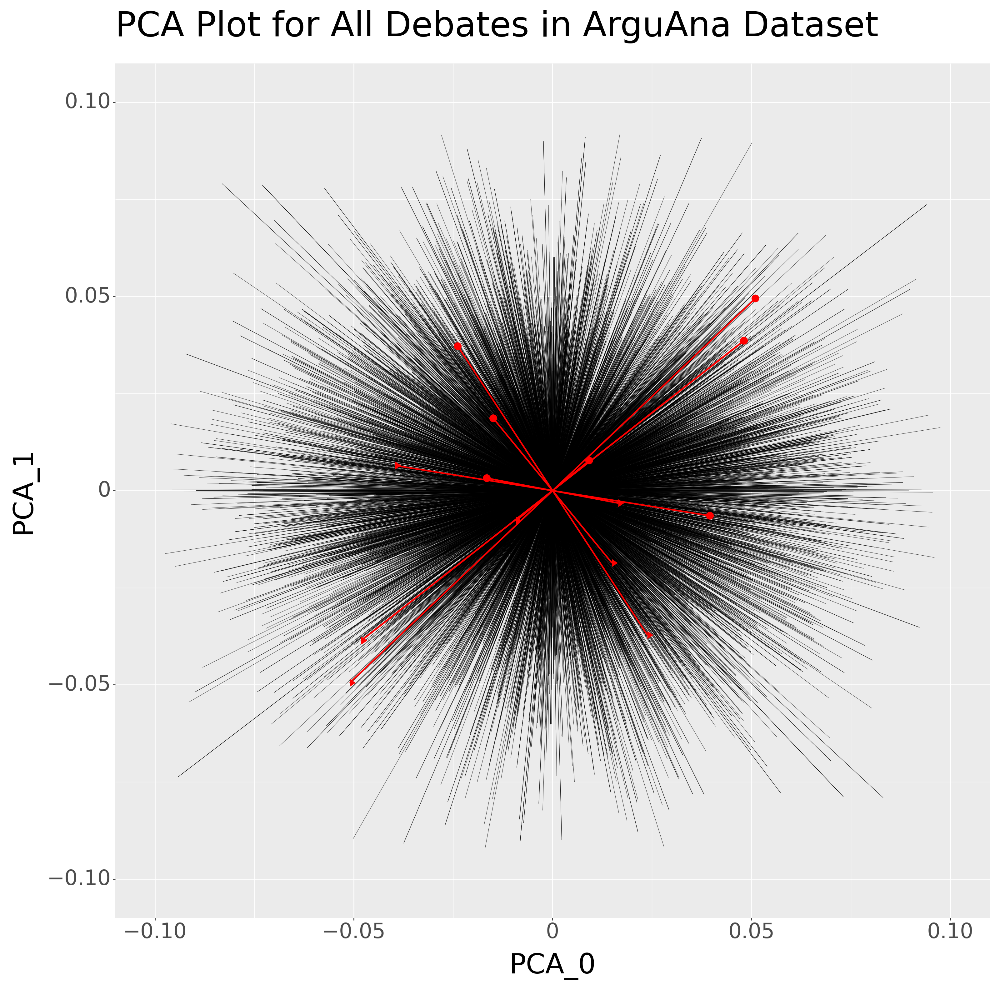

In [ ]:
# Run global level global view pca plot
global_plot(loaded_global_pca_df, ProcessingUnit.GLOBAL, ProcessingUnit.GLOBAL, file_name='global')

<ipython-input-129-bef212eb261c>:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-129-bef212eb261c>:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global-view/global_shuffled_pca_plot.png


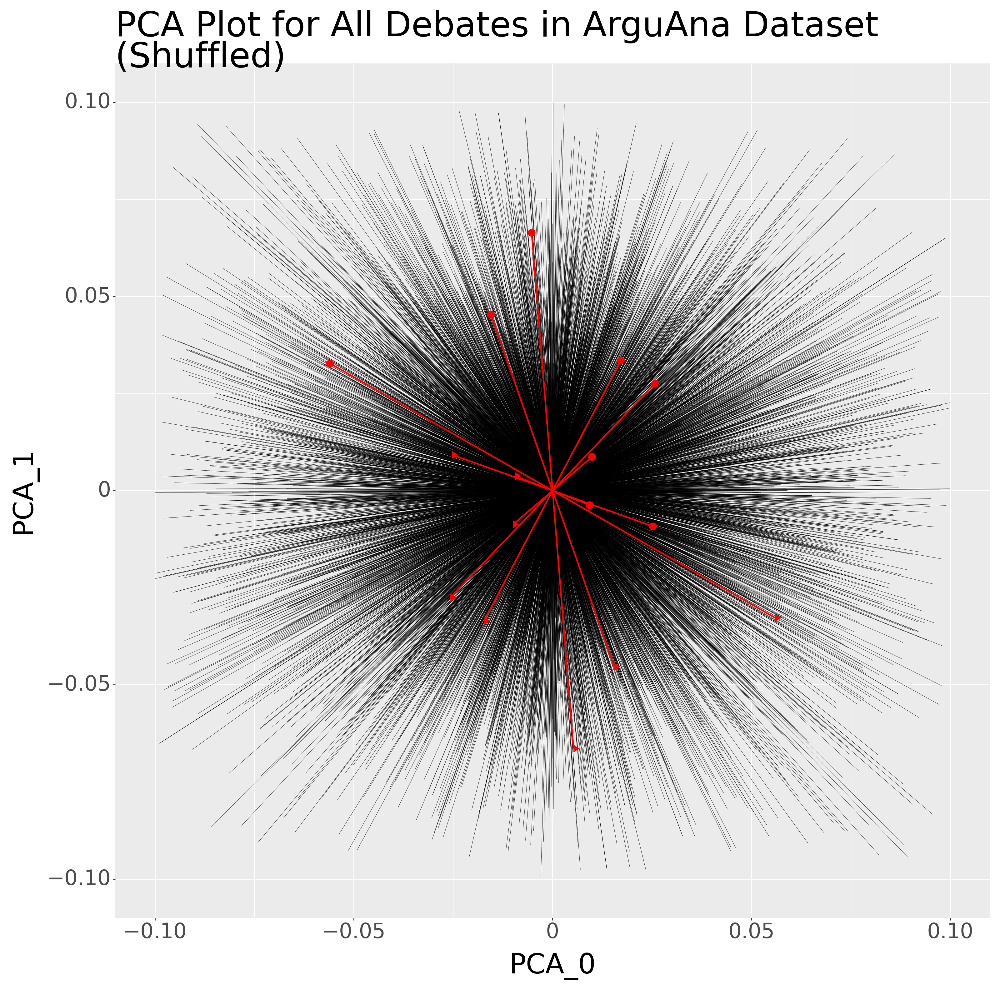

In [ ]:
global_plot(loaded_global_shuffled_pca_df, ProcessingUnit.GLOBAL, ProcessingUnit.GLOBAL, file_name='global_shuffled')

In [ ]:
# Run global level global category facet global view pca plot
global_plot(loaded_global_category_facet_pca_df, ProcessingUnit.CATEGORY, ProcessingUnit.GLOBAL)

In [ ]:
# Run global level global debate facet global view pca plot
global_plot(loaded_global_debate_facet_pca_df, ProcessingUnit.DEBATE, ProcessingUnit.GLOBAL)

### [Run] Global Level PCA Plots -> Category View

In [ ]:
# Run global level category view pca plot
global_plot(loaded_global_pca_df, ProcessingUnit.GLOBAL, ProcessingUnit.CATEGORY)

In [ ]:
# Run global level global category facet category view pca plot
global_plot(loaded_global_category_facet_pca_df, ProcessingUnit.CATEGORY, ProcessingUnit.CATEGORY)

In [ ]:
# Run global level global debate facet category view pca plot
global_plot(loaded_global_debate_facet_pca_df, ProcessingUnit.DEBATE, ProcessingUnit.CATEGORY)

### [Run] Global PCA Components Plot

In [ ]:
loaded_global_pca_obj = joblib.load("current-data-dump/pca-dump/global_pca_obj.pkl")
global_pca_obj = loaded_global_pca_obj.explained_variance_ratio_
global_pca_obj_df = pd.DataFrame({'pca_explained_ratio': global_pca_obj})
global_pca_obj_df['pca_num'] = global_pca_obj_df.index + 1
global_pca_obj_plot = (
    ggplot(global_pca_obj_df, aes(x='pca_num', y='pca_explained_ratio')) +
    geom_bar(stat="identity") +
    labs(
        title=f'Ratio of Explained Variance for Principal Components 1 to 10'
        ) +
    theme(
        axis_title=element_text(size=32),
        axis_text=element_text(size=24),
        plot_title=element_text(size=40, wrap=True, lineheight=1.5),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(16, 16)
    ) +
    scale_x_continuous(breaks=list(range(int(global_pca_obj_df['pca_num'].min()), int(global_pca_obj_df['pca_num'].max()) + 1)))
)
ggsave(global_pca_obj_plot, "current-data-dump/pca-plots-dump/global_pca_components_plot.png")

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global_pca_components_plot.png


In [ ]:
loaded_global_pca_obj = joblib.load("current-data-dump/pca-dump/global_shuffled_pca_obj.pkl")
global_pca_obj = loaded_global_pca_obj.explained_variance_ratio_
global_pca_obj_df = pd.DataFrame({'pca_explained_ratio': global_pca_obj})
global_pca_obj_df['pca_num'] = global_pca_obj_df.index + 1
global_pca_obj_plot = (
    ggplot(global_pca_obj_df, aes(x='pca_num', y='pca_explained_ratio')) +
    geom_bar(stat="identity") +
    labs(
        title=f'Ratio of Explained Variance for Principal Components 1 to 10 (Shuffled)'
        ) +
    theme(
        axis_title=element_text(size=32),
        axis_text=element_text(size=24),
        plot_title=element_text(size=40, wrap=True, lineheight=1.5),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(16, 16)
    ) +
    scale_x_continuous(breaks=list(range(int(global_pca_obj_df['pca_num'].min()), int(global_pca_obj_df['pca_num'].max()) + 1)))
)
ggsave(global_pca_obj_plot, "current-data-dump/pca-plots-dump/global_shuffled_pca_components_plot.png")

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global_shuffled_pca_components_plot.png


### [Run] Export PCA Plots Dump to OSF

In [ ]:
export_pca_plots_dump()

Zip file created at: current-data-dump/pca-plots-dump

File: current-data-dump/pca-plots-dump uploaded at osfstorage


### [Run] Import PCA Plots Dump from OSF

In [ ]:
import_pca_plots_dump()

pca_dump.zip successfully imported
Files extracted: ['global_pca_obj.pkl', 'global_shuffled_pca.pkl', 'international', 'global_shuffled_pca_obj.pkl', 'law', 'global_shuffled_sd_pca_obj.pkl', 'global_category_facet_pca.pkl', 'economy', 'politics', 'global_sd_pca.pkl', 'sport', 'free-speech-debate', 'digital-freedoms', 'global_sd_pca_obj.pkl', 'philosophy', 'religion', 'society', 'health', 'education', 'science', '.ipynb_checkpoints', 'global_shuffled_sd_pca.pkl', 'culture', 'global_pca.pkl', 'environment']


In [ ]:
"""Import pca_dump from OSF"""
subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_evidence_pca_dump.zip", shell=True)
print("pca_dump.zip successfully imported")

pca_dump_file_path_zip = 'nomic_evidence_pca_dump.zip'
pca_dump_file_path = 'current-data-dump/nomicevidence-pca-dump'
with zipfile.ZipFile(pca_dump_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(pca_dump_file_path)

extracted_files = os.listdir(pca_dump_file_path)
print("Files extracted:", extracted_files)

pca_dump.zip successfully imported
Files extracted: ['global_bad_pca.pkl', 'global_pca.pkl', 'global_shuffled_pca_obj.pkl', 'global_bad_pca_obj.pkl', 'global_pca_obj.pkl', '.ipynb_checkpoints', 'global_shuffled_pca.pkl']


In [ ]:
loaded_global_pca_obj = joblib.load("current-data-dump/nomicevidence-pca-dump/global_bad_pca_obj.pkl")
global_pca_obj = loaded_global_pca_obj.explained_variance_ratio_
global_pca_obj_df = pd.DataFrame({'pca_explained_ratio': global_pca_obj})
global_pca_obj_df['pca_num'] = global_pca_obj_df.index + 1

In [ ]:
global_pca_obj_df = pd.concat([global_002_pca_obj_df, global_003_pca_obj_df, global_nomic_pca_obj_df])

In [ ]:
global_pca_obj_df = global_pca_obj_df.reset_index(drop=True)

In [ ]:
global_pca_obj_df['pca_explained_ratio'][0]

0.24194457

In [ ]:
global_pca_obj_df['pca_explained_ratio'][1]

0.038198274

In [ ]:
color_map = {'ada002': 'blue', 'ada003': 'red', 'nomic': 'green'}
global_pca_obj_plot = (
    ggplot(global_pca_obj_df, aes(x='pca_num', y='pca_explained_ratio', color='model')) +
    geom_line(size=2) +
    geom_point(size=4) +
    scale_color_manual(color_map) +
    scale_y_continuous(limits=[0, 0.3]) +
    labs(
        title=f'Ratio of Explained Variance for Principal Components 1 to 10 (Shuffled)'
        ) +
    theme(
        axis_title=element_text(size=32),
        axis_text=element_text(size=24),
        plot_title=element_text(size=40, wrap=True, lineheight=1.5),
        legend_title=element_text(size=32, lineheight=1.5),
        legend_text=element_text(size=24, lineheight=1.5),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(16, 16)
    ) +
    scale_x_continuous(breaks=list(range(int(global_pca_obj_df['pca_num'].min()), int(global_pca_obj_df['pca_num'].max()) + 1)))
)

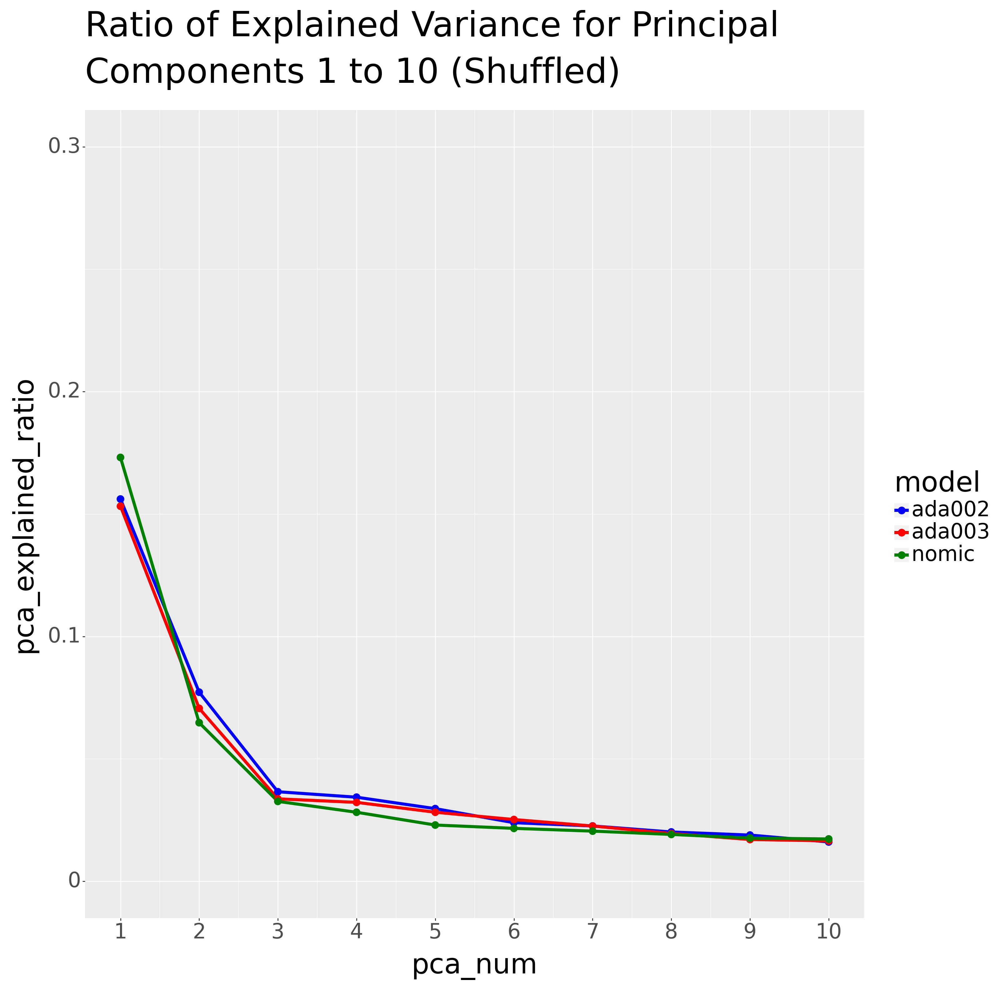

<Figure Size: (1600 x 1600)>

In [ ]:
global_pca_obj_plot